In [3]:
import pandas as pd
data = pd.read_csv("Customer prediction data.csv")
data.head()

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,y
0,58,management,married,tertiary,unknown,5,may,261,1,unknown,no
1,44,technician,single,secondary,unknown,5,may,151,1,unknown,no
2,33,entrepreneur,married,secondary,unknown,5,may,76,1,unknown,no
3,47,blue-collar,married,unknown,unknown,5,may,92,1,unknown,no
4,33,unknown,single,unknown,unknown,5,may,198,1,unknown,no


Supervised Learning,Binary Classification Problem

Data Cleaning

In [4]:
data.isnull().sum()

age               0
job               0
marital           0
education_qual    0
call_type         0
day               0
mon               0
dur               0
num_calls         0
prev_outcome      0
y                 0
dtype: int64

In [5]:
data.shape

(45211, 11)

In [6]:
data = data.drop_duplicates()
data.shape

(45205, 11)

In [7]:
data.dtypes

age                int64
job               object
marital           object
education_qual    object
call_type         object
day                int64
mon               object
dur                int64
num_calls          int64
prev_outcome      object
y                 object
dtype: object

In [8]:
data['y'].value_counts()

no     39916
yes     5289
Name: y, dtype: int64

In [9]:
data['y_new'] = data['y'].map({'yes' : 1 , 'no' : 0})
data.head()

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,y,y_new
0,58,management,married,tertiary,unknown,5,may,261,1,unknown,no,0
1,44,technician,single,secondary,unknown,5,may,151,1,unknown,no,0
2,33,entrepreneur,married,secondary,unknown,5,may,76,1,unknown,no,0
3,47,blue-collar,married,unknown,unknown,5,may,92,1,unknown,no,0
4,33,unknown,single,unknown,unknown,5,may,198,1,unknown,no,0


Age

In [10]:
data.age.unique()

array([58, 44, 33, 47, 35, 28, 42, 43, 41, 29, 53, 57, 51, 45, 60, 56, 32,
       25, 40, 39, 52, 46, 36, 49, 59, 37, 50, 54, 55, 48, 24, 38, 31, 30,
       27, 34, 23, 26, 61, 22, 21, 20, 66, 62, 83, 75, 67, 70, 65, 68, 64,
       69, 72, 71, 19, 76, 85, 63, 90, 82, 73, 74, 78, 80, 94, 79, 77, 86,
       95, 81, 18, 89, 84, 87, 92, 93, 88], dtype=int64)

In [11]:
data.age.describe()

count    45205.000000
mean        40.937087
std         10.619130
min         18.000000
25%         33.000000
50%         39.000000
75%         48.000000
max         95.000000
Name: age, dtype: float64

In [12]:
import plotly.express as px
fig = px.histogram(data, x= 'age', y = 'y_new',title = 'Distribution of age')
fig.update_layout(title_x=0.5)
fig.show()

In [13]:
data.loc[(data.age == 49) & (data.y == 'yes')] #101 rows

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,y,y_new
1247,49,services,married,secondary,unknown,8,may,1119,1,unknown,yes,1
1340,49,admin.,divorced,secondary,unknown,8,may,513,1,unknown,yes,1
3314,49,admin.,single,secondary,unknown,15,may,1257,3,unknown,yes,1
3324,49,unknown,married,primary,unknown,15,may,520,2,unknown,yes,1
9774,49,management,divorced,secondary,unknown,9,jun,1055,10,unknown,yes,1
...,...,...,...,...,...,...,...,...,...,...,...,...
44673,49,admin.,single,tertiary,cellular,3,sep,252,2,success,yes,1
44795,49,management,married,tertiary,cellular,15,sep,316,1,success,yes,1
44809,49,technician,married,tertiary,cellular,16,sep,225,1,success,yes,1
44887,49,management,married,tertiary,cellular,24,sep,249,1,success,yes,1


In [14]:
Q3 = data.age.quantile(0.75)
Q1 = data.age.quantile(0.25)
IQR = Q3 - Q1
Upper_threshold = Q3 + (1.5 * IQR)
Lower_threshold = Q1 - (1.5 * IQR)
Lower_threshold, Upper_threshold

(10.5, 70.5)

In [15]:
data.age = data.age.clip(10, 71)   

In [16]:
data.age.describe()

count    45205.000000
mean        40.874439
std         10.410718
min         18.000000
25%         33.000000
50%         39.000000
75%         48.000000
max         71.000000
Name: age, dtype: float64

In [17]:
#Binning - Convert numerical featured to categorical using bins
bins = range(18,71,5) #[18,23,28,33,38,43,48,53,58,63,66,73]
labels = [0,1,2,3,4,5,6,7,8,9]
data['age_bin'] = pd.cut(data['age'],bins = bins , labels = labels, include_lowest = True)
data.head(1)

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,y,y_new,age_bin
0,58,management,married,tertiary,unknown,5,may,261,1,unknown,no,0,7


In [18]:
data.age_bin.isnull().sum()

598

Call Type

In [19]:
data.call_type.unique()

array(['unknown', 'cellular', 'telephone'], dtype=object)

In [20]:
data.call_type.value_counts()

cellular     29282
unknown      13017
telephone     2906
Name: call_type, dtype: int64

In [21]:
data.groupby('call_type')['y_new'].mean()

call_type
cellular     0.149204
telephone    0.134205
unknown      0.040716
Name: y_new, dtype: float64

In [22]:
import plotly.express as px
call_type = data.groupby('call_type')['y_new'].mean().sort_values(ascending = False)
fig = px.bar(call_type, title = 'Call_type vs target')
fig.show()

In [23]:
fig = px.sunburst(data, path = ['call_type','y'])
fig.show()

Job

In [24]:
data.job.unique()

array(['management', 'technician', 'entrepreneur', 'blue-collar',
       'unknown', 'retired', 'admin.', 'services', 'self-employed',
       'unemployed', 'housemaid', 'student'], dtype=object)

In [25]:
data.job.value_counts()

blue-collar      9730
management       9457
technician       7596
admin.           5170
services         4153
retired          2264
self-employed    1579
entrepreneur     1487
unemployed       1303
housemaid        1240
student           938
unknown           288
Name: job, dtype: int64

In [26]:
import plotly.express as px
import plotly.graph_objects as go
fig = px.pie(data,names = 'job')
fig.update_traces(textposition = 'outside')
fig.show()

In [27]:
data.loc[data.job == 'unknown','job'] = 'blue-collar'
data.job.value_counts()

blue-collar      10018
management        9457
technician        7596
admin.            5170
services          4153
retired           2264
self-employed     1579
entrepreneur      1487
unemployed        1303
housemaid         1240
student            938
Name: job, dtype: int64

In [28]:
data.loc[data.job == 'student']  # 938 rows
data.loc[(data.job == 'student') & (data.y == 'yes')] # 269 rows -> 269/938 = 28%
data.loc[(data.job == 'student') & (data.y == 'no')] # 669 rows -> 669/938 = 72%

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,y,y_new,age_bin
151,26,student,single,secondary,unknown,5,may,610,2,unknown,no,0,1
203,35,student,single,unknown,unknown,5,may,611,2,unknown,no,0,3
265,30,student,single,tertiary,unknown,5,may,89,2,unknown,no,0,2
292,24,student,single,secondary,unknown,5,may,226,3,unknown,no,0,1
297,24,student,single,secondary,unknown,5,may,204,2,unknown,no,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
45080,27,student,single,secondary,cellular,21,oct,256,2,failure,no,0,1
45112,24,student,single,secondary,telephone,26,oct,280,2,success,no,0,1
45143,28,student,single,secondary,cellular,8,nov,137,1,failure,no,0,1
45158,34,student,single,unknown,cellular,9,nov,600,2,failure,no,0,3


In [29]:
data.loc[data.job == 'blue-collar']  # 10018 rows
data.loc[(data.job == 'blue-collar') & (data.y == 'yes')] # 742 rows -> 0.07%
data.loc[(data.job == 'blue-collar') & (data.y == 'no')] # 9276 rows -> 92%

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,y,y_new,age_bin
3,47,blue-collar,married,unknown,unknown,5,may,92,1,unknown,no,0,5
4,33,blue-collar,single,unknown,unknown,5,may,198,1,unknown,no,0,2
17,57,blue-collar,married,primary,unknown,5,may,38,1,unknown,no,0,7
20,28,blue-collar,married,secondary,unknown,5,may,262,1,unknown,no,0,1
22,32,blue-collar,single,primary,unknown,5,may,160,1,unknown,no,0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
45141,71,blue-collar,married,unknown,telephone,8,nov,207,1,success,no,0,NaN
45181,46,blue-collar,married,secondary,cellular,15,nov,74,2,failure,no,0,5
45186,59,blue-collar,married,unknown,cellular,16,nov,280,1,failure,no,0,8
45199,34,blue-collar,single,secondary,cellular,16,nov,1166,3,other,no,0,3


In [30]:
fig = px.bar(data.groupby('job')['y_new'].mean().sort_values(ascending = False))
fig.show()

Marital

In [31]:
data.marital.unique()

array(['married', 'single', 'divorced'], dtype=object)

In [32]:
data.marital.value_counts()

married     27210
single      12788
divorced     5207
Name: marital, dtype: int64

In [33]:
fig = px.pie(data, names = 'marital', hole = 0.5)
fig.show()

In [34]:
(data.loc[(data.marital == 'married') & (data.y == 'yes')]) # 2755 / 27210 =0.10
data.loc[(data.marital == 'single') & (data.y == 'yes')] # 1912 / 12778 =0.14

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,y,y_new,age_bin
270,42,management,single,tertiary,unknown,5,may,562,2,unknown,yes,1,4
446,39,technician,single,unknown,unknown,6,may,1623,1,unknown,yes,1,4
569,28,services,single,secondary,unknown,6,may,1297,3,unknown,yes,1,1
849,37,admin.,single,secondary,unknown,7,may,732,2,unknown,yes,1,3
897,38,admin.,single,secondary,unknown,7,may,786,1,unknown,yes,1,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...
45196,25,student,single,secondary,cellular,16,nov,330,1,unknown,yes,1,1
45197,36,management,single,secondary,cellular,16,nov,270,1,unknown,yes,1,3
45202,34,admin.,single,secondary,cellular,17,nov,224,1,unknown,yes,1,3
45203,23,student,single,tertiary,cellular,17,nov,266,1,unknown,yes,1,0


In [35]:
fig = px.bar(data.groupby('marital')['y_new'].mean().sort_values(ascending = False))
fig.show()

Education Qualification

In [36]:
data.education_qual.unique() # Unknown in this column may refer either missing values

array(['tertiary', 'secondary', 'unknown', 'primary'], dtype=object)

In [37]:
data['education_qual'].value_counts()

secondary    23199
tertiary     13299
primary       6850
unknown       1857
Name: education_qual, dtype: int64

In [38]:
edu_qual_count = data['education_qual'].value_counts()
edu_qual_values = [i for i in edu_qual_count]
qual_list = ['secondary', 'tertiary', 'primary' , 'unknown']
edu_qual = pd.DataFrame(qual_list,columns =['qualification'])
edu_qual['count'] = edu_qual_values
edu_qual

,qualification,count
0,secondary,23199
1,tertiary,13299
2,primary,6850
3,unknown,1857


In [39]:
fig =px.sunburst(data, path = ['education_qual','y'])
fig.show()

In [40]:
data.loc[data.education_qual == 'unknown','education_qual']='secondary'
data.education_qual.value_counts()

secondary    25056
tertiary     13299
primary       6850
Name: education_qual, dtype: int64

In [41]:
fig = px.bar(data.groupby('education_qual')['y_new'].mean().sort_values(ascending = False))
fig.show()

Month

In [42]:
data['mon'].unique()

array(['may', 'jun', 'jul', 'aug', 'oct', 'nov', 'dec', 'jan', 'feb',
       'mar', 'apr', 'sep'], dtype=object)

In [43]:
import datetime
data["mon_edit"] = pd.to_datetime(data["mon"], format='%b').dt.month
data_sorted = data.sort_values(by='mon_edit')

In [44]:
import plotly.graph_objects as go
fig = go.Figure(go.Pie(labels = data['mon'],pull = [0.5,0,0,0,0,0,0,0,0,0,0,0]))
fig.update_traces(textposition = 'outside')
fig.show()

In [45]:
data.mon.value_counts()

may    13765
jul     6894
aug     6245
jun     5339
nov     3970
apr     2932
feb     2649
jan     1403
oct      738
sep      579
mar      477
dec      214
Name: mon, dtype: int64

In [46]:
import plotly.express as px
#fig = px.histogram(data,x = 'mon')
fig = px.bar(data.mon.value_counts().sort_values(ascending = False))
fig.show()

In [47]:
fig = px.bar(data.groupby('mon')['y_new'].mean().sort_values(ascending = False))
fig.show()

In [48]:
fig = px.sunburst(data, path = ['mon','y'])
fig.show()

Day

In [49]:
data['day'].unique()

array([ 5,  6,  7,  8,  9, 12, 13, 14, 15, 16, 19, 20, 21, 23, 26, 27, 28,
       29, 30,  2,  3,  4, 11, 17, 18, 24, 25,  1, 10, 22, 31],
      dtype=int64)

In [50]:
fig = px.scatter_3d(data, x = 'num_calls' , y = 'age' , z= 'mon', color = 'y')
fig = px.scatter_3d(data, x = 'num_calls' , y = 'age' , z= 'y',color = 'y')
fig.show()

Duration

In [51]:
data.dur.unique()

array([ 261,  151,   76, ..., 1298, 1246, 1556], dtype=int64)

In [52]:
data.dur.describe() # 4918 seconds = 1 hr 12 mins.

count    45205.000000
mean       258.183055
std        257.538504
min          0.000000
25%        103.000000
50%        180.000000
75%        319.000000
max       4918.000000
Name: dur, dtype: float64

In [53]:
fig = px.scatter(data, x = 'dur' , y = 'y' , color = 'y')
fig.show()

In [54]:
Q3 = data.dur.quantile(0.75)
Q1 = data.dur.quantile(0.25)
IQR = Q3 - Q1
Upper_threshold = Q3 + ( 1.5 * IQR)
Lower_threshold = Q1 - ( 1.5 * IQR)
Lower_threshold , Upper_threshold 

(-221.0, 643.0)

In [55]:
data.loc[data.dur > 1200]  # upper threshold approximates 10 mins. BUt there are 3235 rows mor than this threshold.

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,y,y_new,age_bin,mon_edit
37,53,technician,married,secondary,unknown,5,may,1666,1,unknown,no,0,6,5
43,54,retired,married,secondary,unknown,5,may,1492,1,unknown,no,0,7,5
59,46,services,married,primary,unknown,5,may,1778,1,unknown,no,0,5,5
86,56,admin.,married,secondary,unknown,5,may,1467,1,unknown,yes,1,7,5
87,41,technician,married,secondary,unknown,5,may,1389,1,unknown,yes,1,4,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
44824,28,admin.,single,secondary,cellular,16,sep,1334,2,unknown,yes,1,1,9
44898,24,management,single,tertiary,cellular,27,sep,1298,1,unknown,yes,1,1,9
44941,34,management,single,tertiary,cellular,6,oct,1246,2,unknown,yes,1,3,10
45016,40,management,married,tertiary,cellular,14,oct,1410,3,unknown,no,0,4,10


In [56]:
data.dur = data.dur.clip(0,1000)
data.dur.describe()

count    45205.000000
mean       250.104568
std        218.604428
min          0.000000
25%        103.000000
50%        180.000000
75%        319.000000
max       1000.000000
Name: dur, dtype: float64

In [57]:
fig = px.histogram(data, x = 'dur')
fig.show()

Number of calls

In [58]:
data.num_calls.unique()

array([ 1,  2,  3,  5,  4,  6,  7,  8,  9, 10, 11, 12, 13, 19, 14, 24, 16,
       32, 18, 22, 15, 17, 25, 21, 43, 51, 63, 41, 26, 28, 55, 50, 38, 23,
       20, 29, 31, 37, 30, 46, 27, 58, 33, 35, 34, 36, 39, 44],
      dtype=int64)

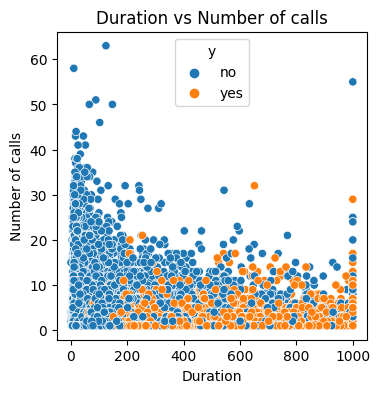

In [59]:
import seaborn as sns
import matplotlib.pyplot as plt
plt.figure(figsize = (4,4))
sns.scatterplot(x = 'dur' , y = 'num_calls' , hue = 'y' , data = data)
plt.title('Duration vs Number of calls')
plt.xlabel('Duration')
plt.ylabel('Number of calls')
ax = plt.gca()

In [60]:
fig = px.histogram(data, x = 'num_calls')
fig.show()

In [61]:
fig = px.scatter(data,x = 'num_calls', y ='y',color = 'y')
fig.show()

In [62]:

Q3 = data.num_calls.quantile(0.75)
Q1 = data.num_calls.quantile(0.25)
IQR = Q3 - Q1
upper_threshold = Q3 + (1.5 * IQR)
lower_threshold = Q1 - (1.5 * IQR)
lower_threshold, upper_threshold

(-2.0, 6.0)

In [63]:
import plotly.express as px
fig =px.sunburst(data, path =['mon','y'])
fig.show()

In [64]:
data.loc[(data.num_calls > 14)]  # >6 ->3064 rows, >14-> 614

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,y,y_new,age_bin,mon_edit
2706,46,admin.,divorced,tertiary,unknown,13,may,69,19,unknown,no,0,5,5
3079,28,blue-collar,married,primary,unknown,14,may,17,24,unknown,no,0,1,5
3118,54,blue-collar,married,secondary,unknown,14,may,302,16,unknown,no,0,7,5
3331,50,entrepreneur,married,primary,unknown,15,may,651,32,unknown,yes,1,6,5
3355,55,blue-collar,married,primary,unknown,15,may,176,18,unknown,no,0,7,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37567,39,management,married,tertiary,cellular,14,may,11,15,failure,no,0,4,5
37792,47,self-employed,married,tertiary,cellular,14,may,199,15,unknown,no,0,5,5
38580,37,admin.,married,secondary,cellular,15,may,284,15,unknown,no,0,3,5
40336,57,entrepreneur,married,tertiary,telephone,18,jun,390,15,unknown,no,0,7,6


In [65]:
fig = px.box(data, x = 'num_calls' , y = 'y')
fig.show()

In [66]:
data.num_calls = data.num_calls.clip(0,10)
data.num_calls.describe()

count    45205.000000
mean         2.583453
std          2.133147
min          1.000000
25%          1.000000
50%          2.000000
75%          3.000000
max         10.000000
Name: num_calls, dtype: float64

Previous Outcome

In [67]:
data.prev_outcome.unique()

array(['unknown', 'failure', 'other', 'success'], dtype=object)

In [68]:
data.prev_outcome.value_counts()

unknown    36953
failure     4901
other       1840
success     1511
Name: prev_outcome, dtype: int64

In [69]:
data.loc[data.prev_outcome == 'unknown','prev_outcome'] = 'other'
data.prev_outcome.value_counts()
     

other      38793
failure     4901
success     1511
Name: prev_outcome, dtype: int64

In [70]:
fig = px.pie(data, names = 'prev_outcome')
fig.show()

In [71]:
fig =px.sunburst(data, path = ['education_qual','prev_outcome','y'])
fig.show()

In [72]:
fig = px.bar(data.groupby('prev_outcome')['y_new'].mean().sort_values(ascending = False))
fig.show()

Target - Y

In [73]:
data.y.unique()

array(['no', 'yes'], dtype=object)

In [74]:
fig = px.pie(data, names = 'y')
fig.show()

Since 88 % falls under one category, this is an imbalanced data.

Sub plots Visualization

In [75]:
from plotly.subplots import make_subplots
#fig=make_subplots(rows=1,cols=2,subplot_titles=("Scatter Plot","Scatter Plot 3D"))
fig=make_subplots(rows=1,cols=2,subplot_titles=("Scatter Plot","Scatter Plot 3D"),specs=[[{"type":"xy"},{"type":"scene"}]])

fig.append_trace(go.Scatter(x=data["dur"],y=data["mon"],mode="markers"),row=1,col=1)
fig.append_trace(go.Scatter3d(x=data['num_calls'],y=data['age'],z= data['y']),row=1,col=2)
#fig.append_trace(go.Pie(values = data['prev_outcome']),row=1,col=2)
fig.update_layout(title_text="subplots")
fig.show()
     

Encoding

In [76]:
data.head()
     

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,y,y_new,age_bin,mon_edit
0,58,management,married,tertiary,unknown,5,may,261,1,other,no,0,7,5
1,44,technician,single,secondary,unknown,5,may,151,1,other,no,0,5,5
2,33,entrepreneur,married,secondary,unknown,5,may,76,1,other,no,0,2,5
3,47,blue-collar,married,secondary,unknown,5,may,92,1,other,no,0,5,5
4,33,blue-collar,single,secondary,unknown,5,may,198,1,other,no,0,2,5


<Axes: xlabel='num_calls', ylabel='dur'>

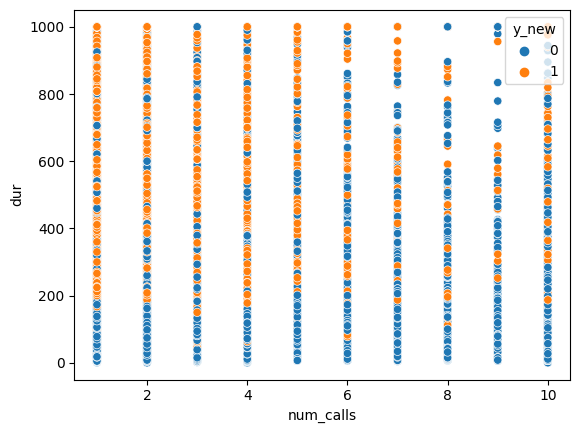

In [77]:
import seaborn as sns
sns.scatterplot(x="num_calls", y="dur", hue='y_new', data=data)

<Axes: xlabel='prev_outcome', ylabel='education_qual'>

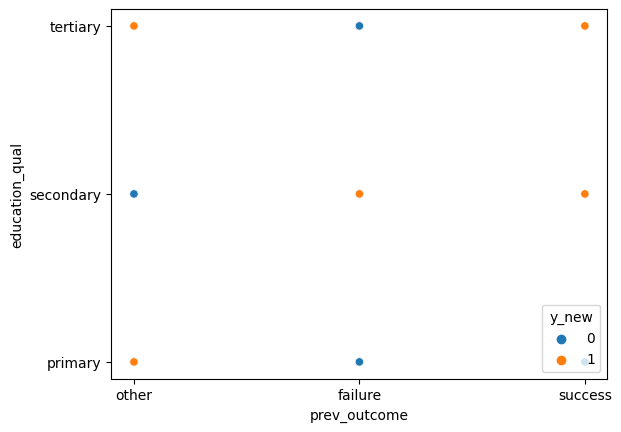

In [78]:
sns.scatterplot(x="prev_outcome", y="education_qual", hue='y_new', data=data)

In [79]:
data = data.drop(['y'], axis = 1)
data.head()

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,y_new,age_bin,mon_edit
0,58,management,married,tertiary,unknown,5,may,261,1,other,0,7,5
1,44,technician,single,secondary,unknown,5,may,151,1,other,0,5,5
2,33,entrepreneur,married,secondary,unknown,5,may,76,1,other,0,2,5
3,47,blue-collar,married,secondary,unknown,5,may,92,1,other,0,5,5
4,33,blue-collar,single,secondary,unknown,5,may,198,1,other,0,2,5


Since encoding doesnt matter much in Tree algorithm, we do label encoding.

In [80]:
cleaned_data = data.copy(deep=True)

In [81]:
data_OHE = pd.get_dummies(data, columns = ['job', 'marital','education_qual','call_type','mon','prev_outcome'])
data_OHE.head()

,age,day,dur,num_calls,y_new,age_bin,mon_edit,job_admin.,job_blue-collar,job_entrepreneur,...,mon_jul,mon_jun,mon_mar,mon_may,mon_nov,mon_oct,mon_sep,prev_outcome_failure,prev_outcome_other,prev_outcome_success
0,58,5,261,1,0,7,5,0,0,0,...,0,0,0,1,0,0,0,0,1,0
1,44,5,151,1,0,5,5,0,0,0,...,0,0,0,1,0,0,0,0,1,0
2,33,5,76,1,0,2,5,0,0,1,...,0,0,0,1,0,0,0,0,1,0
3,47,5,92,1,0,5,5,0,1,0,...,0,0,0,1,0,0,0,0,1,0
4,33,5,198,1,0,2,5,0,1,0,...,0,0,0,1,0,0,0,0,1,0


In [82]:

from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
data = data.apply(encoder.fit_transform)
data.head()

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,y_new,age_bin,mon_edit
0,40,4,1,2,2,4,8,261,0,1,0,7,4
1,26,9,2,1,2,4,8,151,0,1,0,5,4
2,15,2,1,1,2,4,8,76,0,1,0,2,4
3,29,1,1,1,2,4,8,92,0,1,0,5,4
4,15,1,2,1,2,4,8,198,0,1,0,2,4


In [83]:
data.prev_outcome.value_counts()

1    38793
0     4901
2     1511
Name: prev_outcome, dtype: int64

In [84]:
data.marital.value_counts()

1    27210
2    12788
0     5207
Name: marital, dtype: int64

In [85]:
data.education_qual.value_counts()

1    25056
2    13299
0     6850
Name: education_qual, dtype: int64

In [86]:
data.call_type.value_counts()

0    29282
2    13017
1     2906
Name: call_type, dtype: int64

In [87]:
data.mon.value_counts()

8     13765
5      6894
1      6245
6      5339
9      3970
0      2932
3      2649
4      1403
10      738
11      579
7       477
2       214
Name: mon, dtype: int64

In [88]:
data.prev_outcome.value_counts()

1    38793
0     4901
2     1511
Name: prev_outcome, dtype: int64

In [89]:
data.job.value_counts()

1     10018
4      9457
9      7596
0      5170
7      4153
5      2264
6      1579
2      1487
10     1303
3      1240
8       938
Name: job, dtype: int64

In [90]:
cleaned_data = pd.get_dummies(data, columns = ['job','marital','education_qual','prev_outcome'])
cleaned_data.head(1)

,age,call_type,day,mon,dur,num_calls,y_new,age_bin,mon_edit,job_0,...,job_10,marital_0,marital_1,marital_2,education_qual_0,education_qual_1,education_qual_2,prev_outcome_0,prev_outcome_1,prev_outcome_2
0,40,2,4,8,261,0,0,7,4,0,...,0,0,1,0,0,0,1,0,1,0


Final cleaned data

In [91]:
data.isnull().sum()

age               0
job               0
marital           0
education_qual    0
call_type         0
day               0
mon               0
dur               0
num_calls         0
prev_outcome      0
y_new             0
age_bin           0
mon_edit          0
dtype: int64

In [92]:
data.dtypes

age               int64
job               int32
marital           int32
education_qual    int32
call_type         int32
day               int64
mon               int32
dur               int64
num_calls         int64
prev_outcome      int32
y_new             int64
age_bin           int64
mon_edit          int64
dtype: object

In [93]:
data.shape

(45205, 13)

In [94]:
data.describe()

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,y_new,age_bin,mon_edit
count,45205.000000,45205.000000,45205.000000,45205.000000,45205.000000,45205.00000,45205.000000,45205.000000,45205.000000,45205.000000,45205.000000,45205.000000,45205.000000
mean,22.874439,4.276142,1.167703,1.142661,0.640195,14.80688,5.523150,250.034200,1.583453,0.925008,0.117000,3.977768,5.144586
std,10.410718,3.239530,0.608243,0.652213,0.897927,8.32234,3.006935,218.371516,2.133147,0.369083,0.321424,2.105739,2.408153
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,15.000000,1.000000,1.000000,1.000000,0.000000,7.00000,3.000000,103.000000,0.000000,1.000000,0.000000,2.000000,4.000000
50%,21.000000,4.000000,1.000000,1.000000,0.000000,15.00000,6.000000,180.000000,1.000000,1.000000,0.000000,4.000000,5.000000
75%,30.000000,7.000000,2.000000,2.000000,2.000000,20.00000,8.000000,319.000000,2.000000,1.000000,0.000000,5.000000,7.000000
max,53.000000,10.000000,2.000000,2.000000,2.000000,30.00000,11.000000,998.000000,9.000000,2.000000,1.000000,10.000000,11.000000


Correlation

In [95]:
data.corr()

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,y_new,age_bin,mon_edit
age,1.000000,-0.036122,-0.407060,-0.163231,0.027342,-0.008921,-0.043240,-0.010368,0.018924,0.019744,0.019450,0.991207,0.093617
job,-0.036122,1.000000,0.062372,0.184024,-0.089219,0.025787,-0.090898,0.004666,0.004833,0.024240,0.040780,-0.036569,0.041271
marital,-0.407060,0.062372,1.000000,0.119195,-0.039221,-0.005183,-0.006955,0.013160,-0.017104,0.006850,0.045603,-0.404085,-0.050959
education_qual,-0.163231,0.184024,0.119195,1.000000,-0.153952,0.026000,-0.074965,0.001309,0.003265,0.011361,0.068640,-0.162132,0.071897
call_type,0.027342,-0.089219,-0.039221,-0.153952,1.000000,-0.027990,0.361111,-0.027133,0.012541,0.127178,-0.148391,0.027745,-0.173748
day,-0.008921,0.025787,-0.005183,0.026000,-0.027990,1.000000,-0.006116,-0.034150,0.165153,0.043121,-0.028371,-0.008993,0.102052
mon,-0.043240,-0.090898,-0.006955,-0.074965,0.361111,-0.006116,1.000000,0.006318,-0.132399,-0.022515,-0.024490,-0.042681,0.185503
dur,-0.010368,0.004666,0.013160,0.001309,-0.027133,-0.034150,0.006318,1.000000,-0.092120,0.040676,0.410890,-0.009973,-0.015777
num_calls,0.018924,0.004833,-0.017104,0.003265,0.012541,0.165153,-0.132399,-0.092120,1.000000,0.050574,-0.082206,0.018426,0.060456
prev_outcome,0.019744,0.024240,0.006850,0.011361,0.127178,0.043121,-0.022515,0.040676,0.050574,1.000000,0.141093,0.019857,0.063546


Text(0.5, 1.0, 'Correlation Matrix')

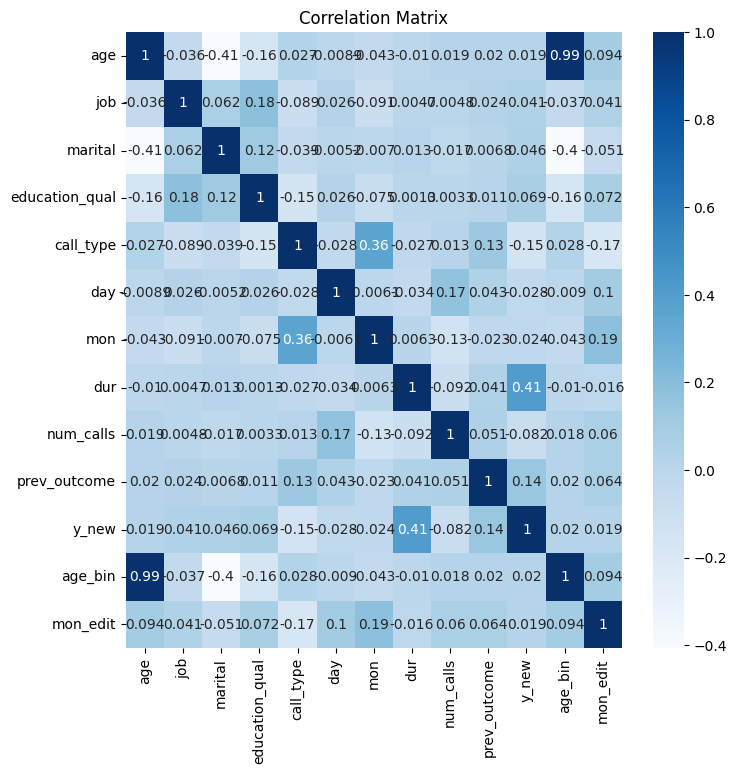

In [96]:
import seaborn as sns
plt.figure(figsize = (8,8))
import matplotlib.pyplot as plt
sns.heatmap(data.corr(), cmap='Blues', annot = True)
plt.title('Correlation Matrix')
     

Sampling

In [97]:
data.y_new.value_counts()

0    39916
1     5289
Name: y_new, dtype: int64

Since the dataset is imbalanced, we need to sample the data. Here we do combination of Over sampling and Under sampling - SMOTEENN (Training data should only be sampled. test data should remain the same)

In [98]:
X = data.drop(['y_new'], axis = 1)
Y = data['y_new']

In [99]:
X_OHE = data_OHE.drop(['y_new'],axis = 1)
Y_OHE = data_OHE['y_new']

In [100]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train,Y_test = train_test_split(X,Y, test_size = 0.20, random_state = 7)
#X_train_OHE, X_test_OHE, Y_train_OHE,Y_test_OHE = train_test_split(X_OHE,Y_OHE, test_size = 0.20, random_state = 7)
     

In [101]:
X_train.describe()

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,age_bin,mon_edit
count,36164.000000,36164.000000,36164.000000,36164.000000,36164.000000,36164.000000,36164.000000,36164.000000,36164.000000,36164.000000,36164.000000,36164.000000
mean,22.845786,4.276103,1.167874,1.140997,0.640858,14.770628,5.524555,250.208273,1.576402,0.924981,3.972569,5.151864
std,10.387936,3.242352,0.606991,0.651767,0.898238,8.299802,3.010546,218.182811,2.120854,0.369804,2.101435,2.410319
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,15.000000,1.000000,1.000000,1.000000,0.000000,7.000000,3.000000,103.000000,0.000000,1.000000,2.000000,4.000000
50%,21.000000,4.000000,1.000000,1.000000,0.000000,15.000000,6.000000,180.000000,1.000000,1.000000,4.000000,5.000000
75%,30.000000,7.000000,2.000000,2.000000,2.000000,20.000000,8.000000,319.000000,2.000000,1.000000,5.000000,7.000000
max,53.000000,10.000000,2.000000,2.000000,2.000000,30.000000,11.000000,998.000000,9.000000,2.000000,10.000000,11.000000


In [102]:

X_train.dtypes

age               int64
job               int32
marital           int32
education_qual    int32
call_type         int32
day               int64
mon               int32
dur               int64
num_calls         int64
prev_outcome      int32
age_bin           int64
mon_edit          int64
dtype: object

In [103]:

Y_train.unique()

array([0, 1], dtype=int64)

Sampling [To balance the imbalanced data]

In [104]:

import imblearn
from imblearn.combine import SMOTEENN    # SMOTE + Edited NearestNeighbors
combo = SMOTEENN(sampling_strategy = 'all',random_state = 42)
X_combo,Y_combo = combo.fit_resample(X_train,Y_train)
#X_combo_OHE,Y_combo_OHE = combo.fit_resample(X_train_OHE,Y_train_OHE)

In [105]:
X_combo.shape , Y_combo.shape

((54210, 12), (54210,))

In [106]:
Y_combo.value_counts()

1    30377
0    23833
Name: y_new, dtype: int64

In [107]:

X_combo.head()

,age,job,marital,education_qual,call_type,day,mon,dur,num_calls,prev_outcome,age_bin,mon_edit
0,22,0,1,1,2,15,8,75,0,1,4,4
1,29,4,1,2,2,19,6,92,2,1,5,5
2,17,7,1,1,0,30,5,5,2,1,3,6
3,19,7,2,1,0,14,8,102,0,0,3,4
4,8,0,2,1,2,18,8,128,2,1,1,4


In [108]:

# #Cluster Centroid Under Sampling:
# from imblearn.under_sampling import ClusterCentroids
# ClustercentroidUS = ClusterCentroids(sampling_strategy = {0 : 20})
# X_sample, Y_sample = ClustercentroidUS.fit_resample(X_train, Y_train)

# #SMOTE Over sampling
from imblearn.over_sampling import SMOTE
smote = SMOTE(sampling_strategy = 'all')
X_smote , Y_smote = smote.fit_resample(X_train, Y_train)

In [109]:
X_smote.shape, Y_smote.shape

((63812, 12), (63812,))

In [110]:
Y_smote.value_counts()

0    31906
1    31906
Name: y_new, dtype: int64

Scaling

In [111]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_smote)
X_test_scaled = scaler.transform(X_test)

Logistic Regression

In [112]:
from sklearn.linear_model import LogisticRegression
LR_model = LogisticRegression()
LR_model.fit(X_train_scaled, Y_smote)  

LogisticRegression()

In [113]:
LR_predict = LR_model.predict(X_test_scaled)
LR_predict_proba = LR_model.predict_proba(X_test_scaled)

In [114]:

from sklearn.metrics import roc_auc_score, accuracy_score
print('Logistic Regression AUROC : ',roc_auc_score(Y_test, LR_predict_proba[:,1]))

Logistic Regression AUROC :  0.8197697834060479


In [115]:
accuracy_score(Y_test,LR_predict)

0.7797809976772481

F1 score for scaling

In [235]:
from sklearn.metrics import f1_score
f1_score(Y_test,LR_predict)

0.4062033999403519

In [116]:
from sklearn.metrics import confusion_matrix
confusion_mat = confusion_matrix(Y_test, LR_predict)
confusion_mat  #[[TN,FP],[FN,TP]]

array([[6369, 1641],
       [ 350,  681]], dtype=int64)

Model Building with KNN classifier

In [117]:
from sklearn.neighbors import KNeighborsClassifier
knnclassifier = KNeighborsClassifier()   
knnclassifier.fit(X_train_scaled , Y_smote) 
#knnclassifier.score(X_test_scaled , Y_test_OHE)

KNN_proba = knnclassifier.predict_proba(X_test_scaled)
KNN_auroc = roc_auc_score(Y_test , KNN_proba[:,1])
print(f'KNN Test AUROC : {(KNN_auroc*100):.2f}%')

KNN Test AUROC : 86.11%


In [118]:
KNN_predict = knnclassifier.predict(X_test_scaled)
accuracy_score(Y_test,KNN_predict)

0.8527817719278841

In [119]:
knnclassifier.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 5,
 'p': 2,
 'weights': 'uniform'}

In [120]:

from sklearn.model_selection import cross_val_score, GridSearchCV
import numpy as np
grid_params = { 'n_neighbors' : [4,5,7,9,11,13,15],
               'weights' : ['uniform','distance'],
               'metric' : ['minkowski','euclidean','manhattan']
               }
gs = GridSearchCV(KNeighborsClassifier(), grid_params, verbose = 1, cv=3, n_jobs = -1)

In [121]:

g_res = gs.fit(X_smote, Y_smote)

Fitting 3 folds for each of 42 candidates, totalling 126 fits


In [122]:
g_res.best_params_

{'metric': 'manhattan', 'n_neighbors': 4, 'weights': 'uniform'}

In [123]:

g_res.best_score_

0.9249671335242723

In [124]:

knn_tuned = KNeighborsClassifier(n_neighbors = 4, metric = 'manhattan',weights = 'distance')   
knn_tuned.fit(X_train_scaled , Y_smote)

Y_predict_proba_knn = knn_tuned.predict_proba(X_test_scaled)
Y_predict_val_knn = knn_tuned.predict(X_test_scaled)

Y_predict_knn = Y_predict_proba_knn[:,1]
KNN_auroc = roc_auc_score(Y_test , Y_predict_knn)
print(f'KNN Classifier AUROC : {(KNN_auroc*100):.2f}%')

KNN Classifier AUROC : 85.02%


In [125]:

accuracy_score(Y_test,Y_predict_val_knn)

0.8672713195442981

F1 score for KNN

In [234]:
from sklearn.metrics import f1_score
f1_score(Y_test,Y_predict_val_knn)

0.5008319467554077

In [126]:
confusion_mat = confusion_matrix(Y_test, Y_predict_val_knn)
confusion_mat  #[[TN,FP],[FN,TP]]

array([[7239,  771],
       [ 429,  602]], dtype=int64)

Model Bulding - Decision Tree Classifier

In [127]:

from sklearn.tree import DecisionTreeClassifier

DT_model_scaled = DecisionTreeClassifier() 
DT_model_scaled.fit(X_smote,Y_smote)

DT_predict_proba = DT_model_scaled.predict_proba(X_test)
DT_predict = DT_predict_proba[:,1]

DT_auroc_scaled = roc_auc_score(Y_test , DT_predict)
print(f'Decision Tree AUROC : {(DT_auroc_scaled*100):.2f}%')

# CV_score = np.mean(cross_val_score(DT_model , X_combo,Y_combo, cv=10))
# print(f'Decision Tree CV-score : {(CV_score*100):.2f}%')

Decision Tree AUROC : 72.14%


Trying Hyper Parameter Tuning

In [128]:
param_dict = {"criterion" : ['gini','entropy'], 'max_depth' : [1,2,3,4,5,6,7,8,9,10,12,15,20]}

grid = GridSearchCV(DT_model_scaled, param_grid = param_dict, cv = 10, n_jobs = -1)

In [129]:

grid.fit(X_train_scaled,Y_smote)

GridSearchCV(cv=10, estimator=DecisionTreeClassifier(), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 15,
                                       20]})

In [130]:

grid.best_score_

0.9139056298197243

In [131]:


grid.best_params_

{'criterion': 'entropy', 'max_depth': 20}

Constructing the model with the best values of hyper parameters

In [132]:

DT_model = DecisionTreeClassifier(criterion = 'entropy',max_depth = 4) 
DT_model.fit(X_smote,Y_smote)

Y_predict_proba = DT_model.predict_proba(X_test)
Y_predict_val_ws = DT_model.predict(X_test)

Y_predict_DT = Y_predict_proba[:,1]
DT_auroc = roc_auc_score(Y_test , Y_predict_DT)
print(f'Decision Tree AUROC : {(DT_auroc*100):.2f}%')

Decision Tree AUROC : 84.19%


In [133]:
confusion_mat = confusion_matrix(Y_test, Y_predict_val_ws)
confusion_mat  #[[TN,FP],[FN,TP]]

array([[5100, 2910],
       [ 133,  898]], dtype=int64)

In [134]:

accuracy_score(Y_test, Y_predict_val_ws)

0.6634221878110829

F1 score for decision tree

In [233]:
from sklearn.metrics import f1_score
f1_score(Y_test, Y_predict_val_ws)

0.37115106426947714

c:\Users\shanm\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:432: UserWarning:

X has feature names, but KNeighborsClassifier was fitted without feature names



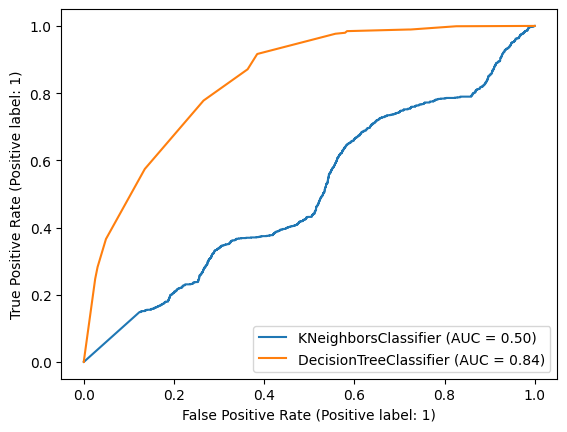

In [135]:

from sklearn.metrics import RocCurveDisplay
knn_disp = RocCurveDisplay.from_estimator(knn_tuned, X_test, Y_test)
dt_disp = RocCurveDisplay.from_estimator(DT_model, X_test, Y_test, ax=knn_disp.ax_)

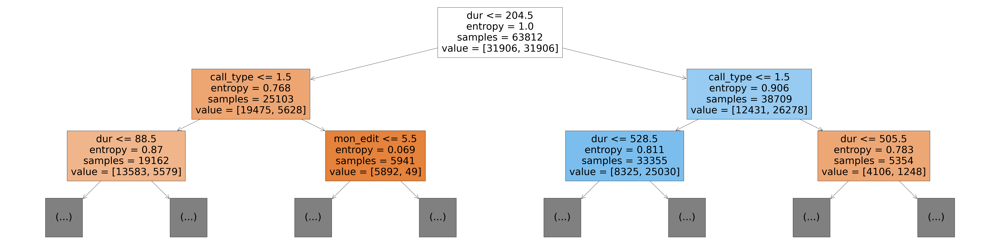

In [136]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree, export_text
plt.figure(figsize =(80,20))

plot_tree(DT_model, feature_names=X_smote.columns, max_depth=2, filled=True);

Feature Importance

In [137]:

X_columns = X_test.columns
feature_importance = DT_model.feature_importances_
feat_imp_format = list(zip(feature_importance , X_columns))
feat_imp_sorted = sorted(feat_imp_format,key = lambda x : x[0], reverse = True)
feat_imp_sorted
     

[(0.6485514504880384, 'dur'),
 (0.2574194672675304, 'call_type'),
 (0.07748450526202307, 'num_calls'),
 (0.01165865678477034, 'mon_edit'),
 (0.004131140584586387, 'mon'),
 (0.0007547796130514549, 'day'),
 (0.0, 'age'),
 (0.0, 'job'),
 (0.0, 'marital'),
 (0.0, 'education_qual'),
 (0.0, 'prev_outcome'),
 (0.0, 'age_bin')]

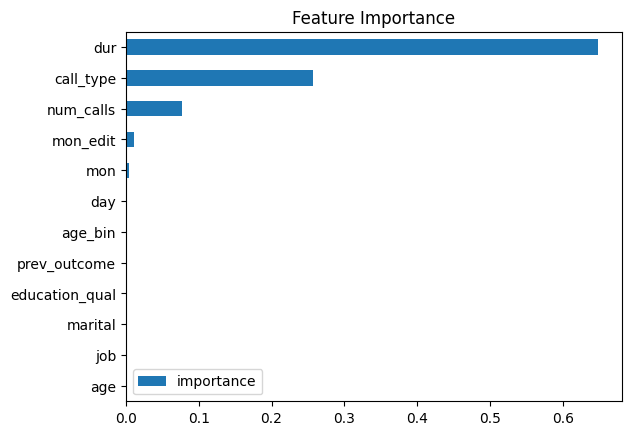

In [138]:

import matplotlib.pyplot as plt
plot_data = pd.DataFrame(feature_importance , index = X_test.columns , columns=['importance'])
plot_data.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()

Voting Classifier

In [139]:

from sklearn.ensemble import VotingClassifier
model1 = LogisticRegression(random_state=7)
model2 = DecisionTreeClassifier(random_state=7)
model3 = KNeighborsClassifier(5)

model = VotingClassifier(estimators=[('lr', model1), ('dt', model2),('knn',model3)], voting='soft') 

model.fit(X_train_scaled,Y_smote) 

Y_predict_voting = model.predict(X_test_scaled)

roc_auc_score(Y_test,model.predict_proba(X_test_scaled)[:,1])

0.8910786831688323

In [140]:

confusion_mat = confusion_matrix(Y_test, Y_predict_voting )
confusion_mat  #[[TN,FP],[FN,TP]]

array([[7253,  757],
       [ 382,  649]], dtype=int64)

In [141]:
accuracy_score(Y_test,Y_predict_voting )

0.8740183608007964

F1 score for voting classifier

In [232]:
from sklearn.metrics import f1_score
f1_score(Y_test,Y_predict_voting)

0.6064516129032258

BootStrap Aggregation - Bagging

In [142]:

from sklearn.ensemble import BaggingClassifier
bagging_model = BaggingClassifier(DecisionTreeClassifier(max_depth = 12, random_state=7), n_estimators=100)
bagging_model.fit(X_smote, Y_smote)
Y_predict_bag = bagging_model.predict_proba(X_test)
Y_predict_bag_val = Y_predict_bag[:,1]
roc_auc_score(Y_test,Y_predict_bag_val)

0.9083953012178038

In [143]:

Y_predict_bag_con = bagging_model.predict(X_test)
confusion_mat = confusion_matrix(Y_test, Y_predict_bag_con)
confusion_mat  #[[TN,FP],[FN,TP]]

array([[7124,  886],
       [ 272,  759]], dtype=int64)

In [144]:

accuracy_score(Y_test, Y_predict_bag_con)

0.8719168233602478

F1 score for bagging

In [231]:
from sklearn.metrics import f1_score
f1_score(Y_test, Y_predict_bag_con)

0.5672645739910314

c:\Users\shanm\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:432: UserWarning:

X has feature names, but LogisticRegression was fitted without feature names

c:\Users\shanm\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:432: UserWarning:

X has feature names, but DecisionTreeClassifier was fitted without feature names

c:\Users\shanm\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\base.py:432: UserWarning:

X has feature names, but KNeighborsClassifier was fitted without feature names



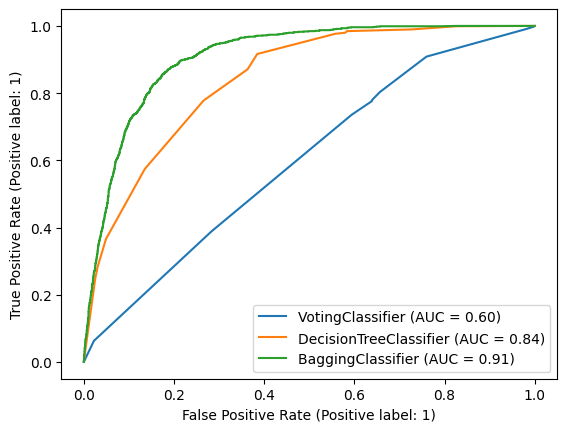

In [145]:


#from sklearn.metrics import RocCurveDisplay
voting_disp = RocCurveDisplay.from_estimator(model, X_test, Y_test)
dt_model = RocCurveDisplay.from_estimator(DT_model,X_test,Y_test,ax = voting_disp.ax_)
bag_disp = RocCurveDisplay.from_estimator(bagging_model, X_test, Y_test, ax=voting_disp.ax_)

Random Forest Algorithm

In [146]:

from sklearn.ensemble import RandomForestClassifier
#from pprint import pprint

RFA_model = RandomForestClassifier() #max_features='sqrt',n_estimators= 100, max_depth = 6
RFA_model.fit(X_smote,Y_smote)

Y_RFA_proba = RFA_model.predict_proba(X_test)
roc_auc_score(Y_test,Y_RFA_proba[:,1])

0.9243687873184707

In [147]:

from sklearn.model_selection import cross_val_score, GridSearchCV
param_grid = {
    'max_depth': [3, 4, 20, 30],  #log2(#features)
    'n_estimators': [150, 300]
}
RFA_GCV_model = RandomForestClassifier()
# Instantiate the grid search model
grid_search = GridSearchCV(estimator = RFA_GCV_model, param_grid = param_grid, cv = 3, n_jobs = -1, verbose = 2)

In [148]:
grid_search.fit(X_smote,Y_smote)
grid_search.best_params_
     

Fitting 3 folds for each of 8 candidates, totalling 24 fits


{'max_depth': 30, 'n_estimators': 150}

In [149]:

RFA_model_tuned = RandomForestClassifier(bootstrap = True,max_features='sqrt',random_state = 42,n_estimators= 150)
RFA_model_tuned.fit(X_smote,Y_smote)

Y_predict_RFA_proba = RFA_model_tuned.predict_proba(X_test)
Y_predict_RFA = Y_predict_RFA_proba[:,1]

Y_predict_RFA_val = RFA_model_tuned.predict(X_test)

RFA_auroc = roc_auc_score(Y_test , Y_predict_RFA)
print(f'RandomForest AUROC : {(RFA_auroc*100):.2f}%')

RandomForest AUROC : 92.47%


In [150]:


confusion_mat = confusion_matrix(Y_test, Y_predict_RFA_val)
confusion_mat  #[[TN,FP],[FN,TP]]

array([[7407,  603],
       [ 335,  696]], dtype=int64)

In [151]:

accuracy_score(Y_test,Y_predict_RFA_val)

0.8962504147771264

F1 score for random forest 

In [230]:
from sklearn.metrics import f1_score
f1_score(Y_test,Y_predict_RFA_val)

0.5974248927038627

In [152]:

# Pull out one tree from the forest
tree = RFA_model_tuned.estimators_[90]
tree

DecisionTreeClassifier(max_features='sqrt', random_state=698027879)

In [153]:

print('The depth of this tree is:', tree.tree_.max_depth)

The depth of this tree is: 34


In [154]:
feature_importance_RFA = RFA_model_tuned.feature_importances_
feature_imp_RFA_formated = list(zip(feature_importance_RFA,X_test.columns))
feature_imp_RFA_sorted = sorted(feature_imp_RFA_formated, key = lambda x: x [0] , reverse = True)
feature_imp_RFA_sorted

[(0.34694605123930594, 'dur'),
 (0.1066998684283685, 'mon_edit'),
 (0.09732088497989061, 'call_type'),
 (0.09339120674132691, 'day'),
 (0.09252108086104653, 'mon'),
 (0.06751148195794264, 'age'),
 (0.04827541084280605, 'num_calls'),
 (0.047982569241693404, 'job'),
 (0.037198595293913304, 'age_bin'),
 (0.024262578214600393, 'prev_outcome'),
 (0.019595853488371253, 'education_qual'),
 (0.0182944187107343, 'marital')]

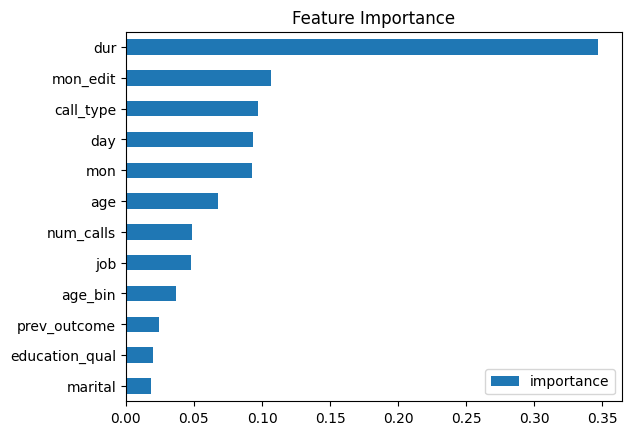

In [155]:

plot_data = pd.DataFrame(feature_importance_RFA , index = X_test.columns , columns=['importance'])
plot_data.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()
     

Using XGBoost ML Algorithm

In [156]:
import xgboost as xgb
import numpy as np
from sklearn.model_selection import cross_val_score
for lr in [0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.1,0.11,0.12,0.13,0.14,0.15,0.2,0.5,0.7,1]:
  model = xgb.XGBClassifier(learning_rate = lr, n_estimators=100, verbosity = 0) 
  model.fit(X_smote,Y_smote) 
  print("Learning rate : ", lr, " Train score : ", model.score(X_smote,Y_smote), " Cross-Val score : ", np.mean(cross_val_score(model,X_smote, Y_smote, cv=10)))

Learning rate :  0.01  Train score :  0.8502946154328339  Cross-Val score :  0.8441995811660981
Learning rate :  0.02  Train score :  0.8595091832257256  Cross-Val score :  0.8550125821570236
Learning rate :  0.03  Train score :  0.8874036231429825  Cross-Val score :  0.8786447087534773
Learning rate :  0.04  Train score :  0.9023537892559393  Cross-Val score :  0.8941593366313766
Learning rate :  0.05  Train score :  0.9103930295242274  Cross-Val score :  0.9018383052240397
Learning rate :  0.06  Train score :  0.9157995361374036  Cross-Val score :  0.9063360279417738
Learning rate :  0.07  Train score :  0.9176330470757851  Cross-Val score :  0.9115232486407985
Learning rate :  0.08  Train score :  0.9233686453958503  Cross-Val score :  0.9136860983261229
Learning rate :  0.09  Train score :  0.9266438914310788  Cross-Val score :  0.9149711535406226
Learning rate :  0.1  Train score :  0.9293079671535135  Cross-Val score :  0.9165383330359624
Learning rate :  0.11  Train score :  0.9

In [157]:
import xgboost as xgb
import numpy as np
from sklearn.model_selection import cross_val_score
model = xgb.XGBClassifier(learning_rate = 0.1) 
model.fit(X_smote,Y_smote)
print(" Train score : ", model.score(X_smote,Y_smote), " Cross-Val score : ", np.mean(cross_val_score(model,X_smote, Y_smote, cv=10)))

 Train score :  0.9293079671535135  Cross-Val score :  0.9165383330359624


In [158]:

xgb_model = xgb.XGBClassifier(learning_rate = 0.1)  #n_estimators = 300,gamma = ,learning_rate = 0.1

xgb_model.fit(X_smote, Y_smote)

Y_predict_XGB_proba = xgb_model.predict_proba(X_test)
Y_predict_XGB = Y_predict_XGB_proba[:,1]

Y_predict_XGB = xgb_model.predict(X_test)

XGB_auroc = roc_auc_score(Y_test , Y_predict_XGB)
print(f'XGB AUROC : {(XGB_auroc*100):.2f}%')

XGB AUROC : 82.08%


In [159]:

Y_predict_XGB_val = model.predict(X_test)
accuracy_score(Y_test, Y_predict_XGB_val)

0.8890609445857759

F1 score for XG boosting

In [229]:
from sklearn.metrics import f1_score
f1_score(Y_test, Y_predict_XGB_val)

0.600875447672105

In [160]:

confusion_mat = confusion_matrix(Y_test, Y_predict_XGB_val)
confusion_mat  #[[TN,FP],[FN,TP]]

array([[7283,  727],
       [ 276,  755]], dtype=int64)

In [161]:
from sklearn.model_selection import cross_validate
cv_results_model = cross_validate(xgb_model, X_smote, Y_smote, cv= 10,scoring=('roc_auc'),return_estimator = True)
cv_results_model
     

{'fit_time': array([4.34512281, 3.18950629, 3.3412509 , 3.48647165, 3.28029609,
        3.30217552, 3.36577678, 3.21907139, 3.23501325, 3.32899761]),
 'score_time': array([0.02393651, 0.02194214, 0.02201223, 0.02293825, 0.02094483,
        0.02293968, 0.01894879, 0.01994681, 0.02093911, 0.02094436]),
 'estimator': [XGBClassifier(base_score=None, booster=None, callbacks=None,
                colsample_bylevel=None, colsample_bynode=None,
                colsample_bytree=None, early_stopping_rounds=None,
                enable_categorical=False, eval_metric=None, feature_types=None,
                gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
                interaction_constraints=None, learning_rate=0.1, max_bin=None,
                max_cat_threshold=None, max_cat_to_onehot=None,
                max_delta_step=None, max_depth=None, max_leaves=None,
                min_child_weight=None, missing=nan, monotone_constraints=None,
                n_estimators=100, n_job

In [162]:

model_validated = cv_results_model['estimator'][8]
model_validated 
     

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [163]:
XGB_Model_final = model_validated.fit(X_smote,Y_smote)
Y_predict_XGB_proba = XGB_Model_final.predict_proba(X_test)
Y_predict_XGB = Y_predict_XGB_proba[:,1]

Y_predict_val = XGB_Model_final.predict(X_test)

XGB_auroc = roc_auc_score(Y_test , Y_predict_XGB)
print(f'Validated XGB AUROC : {(XGB_auroc*100):.2f}%')

Validated XGB AUROC : 92.28%


In [164]:
confusion_mat = confusion_matrix(Y_test, Y_predict_val)
confusion_mat  #[[TN,FP],[FN,TP]]
     

array([[7283,  727],
       [ 276,  755]], dtype=int64)

In [165]:

accuracy_score(Y_test, Y_predict_val)

0.8890609445857759

In [166]:
import warnings
warnings.filterwarnings('ignore')
eval_set = [(X_test,Y_test)]                               
XGB_model_tuned = model_validated.fit(X_smote,Y_smote,early_stopping_rounds = 10, eval_metric = 'error',eval_set=eval_set, verbose=2)
# Y_predict_XGB = XGB_model_tuned.predict(X_test)
cv_results = cross_validate(XGB_model_tuned , X_smote, Y_smote, cv= 10,scoring=('roc_auc'),return_estimator = True)
cv_results
     

[0]	validation_0-error:0.21568
[2]	validation_0-error:0.21756
[4]	validation_0-error:0.22807
[6]	validation_0-error:0.22033


[8]	validation_0-error:0.20971
[10]	validation_0-error:0.20717
[12]	validation_0-error:0.21148
[14]	validation_0-error:0.20341
[16]	validation_0-error:0.20164
[18]	validation_0-error:0.19644
[20]	validation_0-error:0.19190
[22]	validation_0-error:0.19013
[24]	validation_0-error:0.18305
[26]	validation_0-error:0.17885
[28]	validation_0-error:0.16967
[30]	validation_0-error:0.16370
[32]	validation_0-error:0.15739
[34]	validation_0-error:0.15518
[36]	validation_0-error:0.15131
[38]	validation_0-error:0.15032
[40]	validation_0-error:0.14357
[42]	validation_0-error:0.13760
[44]	validation_0-error:0.13472
[46]	validation_0-error:0.13372
[48]	validation_0-error:0.13406
[50]	validation_0-error:0.13273
[52]	validation_0-error:0.13195
[54]	validation_0-error:0.13074
[56]	validation_0-error:0.13030
[58]	validation_0-error:0.12830
[60]	validation_0-error:0.12720
[62]	validation_0-error:0.12366
[64]	validation_0-error:0.12311
[66]	validation_0-error:0.12233
[68]	validation_0-error:0.12134
[70]	vali

{'fit_time': array([4.30054832, 3.91295004, 3.29296875, 3.1783607 , 3.53897405,
        3.23522997, 3.22975421, 3.41555333, 3.4228282 , 3.2695384 ]),
 'score_time': array([0.01994824, 0.01981902, 0.02094531, 0.0193541 , 0.02194238,
        0.0199461 , 0.02094483, 0.02393579, 0.0209446 , 0.0197227 ]),
 'estimator': [XGBClassifier(base_score=None, booster=None, callbacks=None,
                colsample_bylevel=None, colsample_bynode=None,
                colsample_bytree=None, early_stopping_rounds=None,
                enable_categorical=False, eval_metric=None, feature_types=None,
                gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
                interaction_constraints=None, learning_rate=0.1, max_bin=None,
                max_cat_threshold=None, max_cat_to_onehot=None,
                max_delta_step=None, max_depth=None, max_leaves=None,
                min_child_weight=None, missing=nan, monotone_constraints=None,
                n_estimators=100, n_job

In [167]:

XGB_model_validated = cv_results['estimator'][8]
XGB_model_validated

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, gpu_id=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              n_estimators=100, n_jobs=None, num_parallel_tree=None,
              predictor=None, random_state=None, ...)

In [168]:
XGB_model_validated.fit(X_smote,Y_smote)
Y_predict_XGB_proba = XGB_model_validated.predict_proba(X_test)
Y_predict_XGB = Y_predict_XGB_proba[:,1]

Y_predict_val_XGB = XGB_model_validated.predict(X_test)

XGB_auroc = roc_auc_score(Y_test , Y_predict_XGB)
print(f'Validated XGB AUROC : {(XGB_auroc*100):.2f}%')

Validated XGB AUROC : 92.28%


In [169]:
confusion_mat_XGB = confusion_matrix(Y_test, Y_predict_val_XGB)
confusion_mat_XGB  #[[TN,FP],[FN,TP]]

array([[7283,  727],
       [ 276,  755]], dtype=int64)

In [170]:

accuracy_score(Y_test, Y_predict_val_XGB)

0.8890609445857759

Predicting the model with our values

In [171]:
'''
input_col = ['age', 'job', 'marital', 'education_qual', 'call_type', 'day', 'mon', 'dur', 'num_calls', 'prev_outcome']
input_data = [32,8,2,2,0,20,8,500,3,2]
input = pd.DataFrame(np.column_stack(input_data),columns = input_col)
Y_predict_val = XGB_Model_final.predict(input)
Y_predict_val
'''

"\ninput_col = ['age', 'job', 'marital', 'education_qual', 'call_type', 'day', 'mon', 'dur', 'num_calls', 'prev_outcome']\ninput_data = [32,8,2,2,0,20,8,500,3,2]\ninput = pd.DataFrame(np.column_stack(input_data),columns = input_col)\nY_predict_val = XGB_Model_final.predict(input)\nY_predict_val\n"

In [172]:
'''
params = { 'max_depth':[4,8,12,15,30] }
XGB_gridsearch = GridSearchCV(XGB_model_validated, params, n_jobs=-1, cv=3, scoring='roc_auc', verbose=2, refit=True)
XGB_gridsearch.fit(X_train_scaled,Y_combo)
XGB_gridsearch.best_params_
'''

"\nparams = { 'max_depth':[4,8,12,15,30] }\nXGB_gridsearch = GridSearchCV(XGB_model_validated, params, n_jobs=-1, cv=3, scoring='roc_auc', verbose=2, refit=True)\nXGB_gridsearch.fit(X_train_scaled,Y_combo)\nXGB_gridsearch.best_params_\n"

Feature Importance

In [173]:
feature_importance_XGB = XGB_model_validated.feature_importances_
feature_importance_XGB_formated = list(zip(feature_importance_XGB,X_test.columns))
feature_importance_XGB_sorted = sorted(feature_importance_XGB_formated, key = lambda x : x[0], reverse = True)
feature_importance_XGB_sorted

[(0.33971086, 'call_type'),
 (0.15670238, 'dur'),
 (0.08674932, 'num_calls'),
 (0.082473755, 'mon_edit'),
 (0.074594244, 'mon'),
 (0.058500364, 'prev_outcome'),
 (0.039365564, 'day'),
 (0.037792742, 'job'),
 (0.03644688, 'age_bin'),
 (0.032919444, 'education_qual'),
 (0.030951332, 'marital'),
 (0.023793133, 'age')]

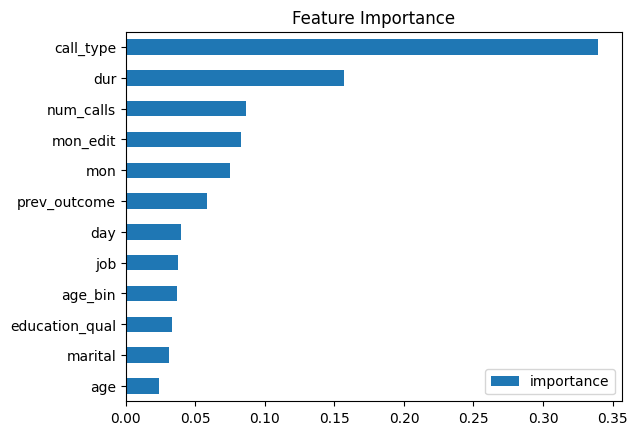

In [174]:
plot_data = pd.DataFrame(feature_importance_XGB , index = X_test.columns , columns=['importance'])
plot_data.sort_values('importance').plot(kind='barh', title='Feature Importance')
plt.show()
     

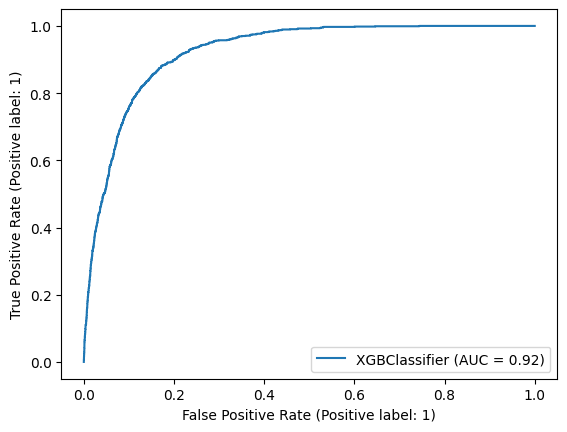

In [175]:

xgb_disp = RocCurveDisplay.from_estimator(XGB_model_validated, X_test, Y_test)

Building model with 4 important features

In [176]:

X_imp = X_smote[['call_type','prev_outcome','dur','mon']]  
Y_imp = Y_smote
X_test_imp = X_test[['call_type','prev_outcome','dur','mon']]
X_imp.head()

,call_type,prev_outcome,dur,mon
0,2,1,75,8
1,2,1,92,6
2,0,1,5,5
3,0,0,235,3
4,0,0,102,8


In [177]:

XGB_model_validated.fit(X_imp,Y_imp)
Y_predict_XGB_imp_proba = XGB_model_validated.predict_proba(X_test_imp)
Y_predict_XGB_imp = Y_predict_XGB_imp_proba[:,1]
XGB_auroc_imp = roc_auc_score(Y_test , Y_predict_XGB_imp)
print(f'XGB AUROC with Imp features : {(XGB_auroc_imp*100):.2f}%')

XGB AUROC with Imp features : 89.88%


PCA - Dimensionality Reduction

In [178]:

from sklearn.decomposition import PCA
for count in [2,4,6,8,9]:
  pca = PCA(n_components = count)
  pca.fit(X_train_scaled , X_test_scaled)
  print(sum(pca.explained_variance_ratio_))

0.3174546651950404
0.5244336502289659
0.6945671885117023
0.839261327494087
0.9049084500118472


In [179]:
pca = PCA(n_components=2)
PCA_columns = pca.fit_transform(X_smote)
PCA_data = pd.DataFrame(data = PCA_columns, columns = ['Column 1', 'Column 2'])
PCA_combined = pd.concat([PCA_data, data[['y_new']]], axis = 1)

Pickling

In [180]:

import pickle

pickle_out = open('trained_model.pkl', 'wb')
pickle.dump(XGB_Model_final,pickle_out)
pickle_out.close()

In [181]:

loaded_model = pickle.load(open('trained_model.pkl','rb'))

In [182]:

#loaded_model.predict(input)

Light Weight Gradient Boosting

In [183]:

from lightgbm import LGBMClassifier
LGBM_model = LGBMClassifier()
LGBM_model.fit(X_smote,Y_smote)

Y_predict_LGBM = LGBM_model.predict_proba(X_test)
Y_predict_LGBM_val = LGBM_model.predict(X_test)

roc_auc_score(Y_test,Y_predict_LGBM[:,1])

0.9275521868275712

In [184]:

accuracy_score(Y_test,Y_predict_LGBM_val)

0.8911624820263245

In [185]:

confusion_mat_LGBM = confusion_matrix(Y_test, Y_predict_LGBM_val)
confusion_mat_LGBM  #[[TN,FP],[FN,TP]]

array([[7319,  691],
       [ 293,  738]], dtype=int64)

In [186]:

parameters = {
    "learning_rate" :[0.001,0.1,0.2,0.3,0.5,0.7,1],
    "max_depth" : [3,5,7],
    "subsample" :[0.6,0.8,1]
}

grid = GridSearchCV(LGBM_model,param_grid = parameters,cv = 10, n_jobs = -1)
grid.fit(X_combo,Y_combo)
print(grid.best_params_)

{'learning_rate': 0.5, 'max_depth': 5, 'subsample': 0.6}


In [187]:
LGBM_model_tuned = LGBMClassifier(learning_rate = 0.1,max_bin = 20,num_leaves = 40,min_gain_to_split =1)
LGBM_model_tuned.fit(X_smote,Y_smote)

LGBMClassifier(max_bin=20, min_gain_to_split=1, num_leaves=40)

In [188]:

Y_predict_LGBM = LGBM_model_tuned.predict_proba(X_test)
Y_predict_LGBM_val = LGBM_model_tuned.predict(X_test)

roc_auc_score(Y_test,Y_predict_LGBM[:,1])

0.9274582208708563

In [189]:

params = {
    'num_leaves': [20, 30,40, ],
     }

LGBM_gridsearch = GridSearchCV(LGBM_model_tuned, params, n_jobs=-1, cv=3, scoring='roc_auc', verbose=2, refit=True)
LGBM_gridsearch.fit(X_combo,Y_combo)
LGBM_gridsearch.best_params_

Fitting 3 folds for each of 3 candidates, totalling 9 fits


[LightGBM] [Warning] min_gain_to_split is set=1, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1


{'num_leaves': 40}

In [190]:

cv_results_model = cross_validate(LGBM_model_tuned, X_smote, Y_smote, cv= 10,scoring=('roc_auc'),return_estimator = True)
cv_results_model

[LightGBM] [Warning] min_gain_to_split is set=1, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1
[LightGBM] [Warning] min_gain_to_split is set=1, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1
[LightGBM] [Warning] min_gain_to_split is set=1, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1
[LightGBM] [Warning] min_gain_to_split is set=1, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1
[LightGBM] [Warning] min_gain_to_split is set=1, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1
[LightGBM] [Warning] min_gain_to_split is set=1, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1
[LightGBM] [Warning] min_gain_to_split is set=1, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1
[LightGBM] [Warning] min_gain_to_split is set=1, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1
[LightGBM] [Warning] min_gain_to_split i

{'fit_time': array([0.87390018, 0.73801541, 0.71912408, 0.84552813, 0.7794466 ,
        0.87046933, 0.70803547, 0.7175796 , 0.80065775, 0.72164345]),
 'score_time': array([0.03191376, 0.03191543, 0.03291249, 0.03390908, 0.0329113 ,
        0.03291202, 0.03191543, 0.03113341, 0.03611898, 0.03291273]),
 'estimator': [LGBMClassifier(max_bin=20, min_gain_to_split=1, num_leaves=40),
  LGBMClassifier(max_bin=20, min_gain_to_split=1, num_leaves=40),
  LGBMClassifier(max_bin=20, min_gain_to_split=1, num_leaves=40),
  LGBMClassifier(max_bin=20, min_gain_to_split=1, num_leaves=40),
  LGBMClassifier(max_bin=20, min_gain_to_split=1, num_leaves=40),
  LGBMClassifier(max_bin=20, min_gain_to_split=1, num_leaves=40),
  LGBMClassifier(max_bin=20, min_gain_to_split=1, num_leaves=40),
  LGBMClassifier(max_bin=20, min_gain_to_split=1, num_leaves=40),
  LGBMClassifier(max_bin=20, min_gain_to_split=1, num_leaves=40),
  LGBMClassifier(max_bin=20, min_gain_to_split=1, num_leaves=40)],
 'test_score': array([0.

In [191]:

LGBM_model_validated = cv_results_model['estimator'][8]
LGBM_model_validated

LGBMClassifier(max_bin=20, min_gain_to_split=1, num_leaves=40)

In [192]:

LGBM_model_validated.fit(X_smote,Y_smote)

Y_predict_LGBM = LGBM_model_validated.predict_proba(X_test)
Y_predict_LGBM_val = LGBM_model_validated.predict(X_test)

roc_auc_score(Y_test,Y_predict_LGBM[:,1])

[LightGBM] [Warning] min_gain_to_split is set=1, min_split_gain=0.0 will be ignored. Current value: min_gain_to_split=1


0.9274582208708563

In [193]:

accuracy_score(Y_test,Y_predict_LGBM_val)

0.8906094458577591

F1 score for LGBM Classifer

In [227]:
from sklearn.metrics import f1_score
f1_score(Y_test,Y_predict_LGBM_val)

0.6013704151551794

In [194]:

confusion_mat = confusion_matrix(Y_test,Y_predict_LGBM_val)
confusion_mat

array([[7306,  704],
       [ 285,  746]], dtype=int64)

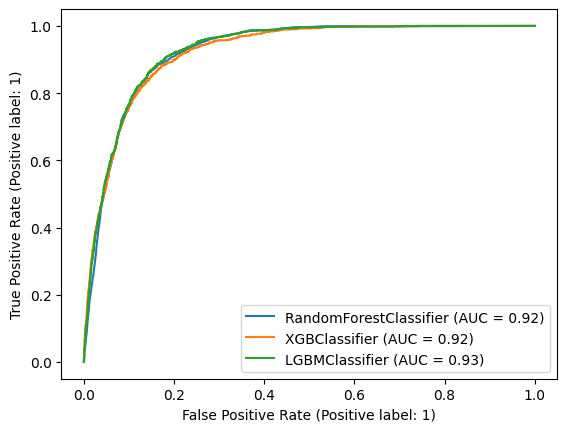

In [195]:

from sklearn.metrics import RocCurveDisplay
rfa_disp = RocCurveDisplay.from_estimator(RFA_model_tuned, X_test, Y_test)
xgboost_disp = RocCurveDisplay.from_estimator(XGB_Model_final , X_test, Y_test,ax=rfa_disp.ax_)
lgbm_disp = RocCurveDisplay.from_estimator(LGBM_model_validated, X_test, Y_test, ax=rfa_disp.ax_)

AdaBoost Algorithm

In [196]:

from sklearn.ensemble import AdaBoostClassifier 
from sklearn.tree import DecisionTreeClassifier
dtree = DecisionTreeClassifier()
adaboost_model = AdaBoostClassifier(learning_rate=1)
adaboost_model.fit(X_smote,Y_smote)
Y_predict_ada = adaboost_model.predict_proba(X_test)
Y_predict_ada_val = adaboost_model.predict(X_test)

roc_auc_score(Y_test,Y_predict_ada[:,1])

0.881420653862594

CatBoost Algorithm

In [197]:

from catboost import CatBoostClassifier
cat_model = CatBoostClassifier() 
cat_model.fit(X_smote,Y_smote)

Learning rate set to 0.060761
0:	learn: 0.6501846	total: 179ms	remaining: 2m 59s
1:	learn: 0.6143872	total: 202ms	remaining: 1m 40s
2:	learn: 0.5837651	total: 221ms	remaining: 1m 13s
3:	learn: 0.5599370	total: 239ms	remaining: 59.4s
4:	learn: 0.5410533	total: 257ms	remaining: 51.1s
5:	learn: 0.5247386	total: 280ms	remaining: 46.3s
6:	learn: 0.5104052	total: 303ms	remaining: 43s
7:	learn: 0.4974046	total: 322ms	remaining: 40s
8:	learn: 0.4851341	total: 346ms	remaining: 38.1s
9:	learn: 0.4762870	total: 368ms	remaining: 36.4s
10:	learn: 0.4683502	total: 389ms	remaining: 34.9s
11:	learn: 0.4602969	total: 416ms	remaining: 34.2s
12:	learn: 0.4538443	total: 437ms	remaining: 33.2s
13:	learn: 0.4482275	total: 461ms	remaining: 32.5s
14:	learn: 0.4408413	total: 486ms	remaining: 31.9s
15:	learn: 0.4355892	total: 507ms	remaining: 31.2s
16:	learn: 0.4210808	total: 526ms	remaining: 30.4s
17:	learn: 0.4139332	total: 548ms	remaining: 29.9s
18:	learn: 0.4105309	total: 567ms	remaining: 29.3s
19:	learn: 0

In [198]:

Y_predict_cat = cat_model.predict_proba(X_test)
Y_predict_cat_val = cat_model.predict(X_test)
roc_auc_score(Y_test,Y_predict_cat[:,1])

0.9283737229530012

In [199]:


accuracy_score(Y_test,Y_predict_cat_val)

0.8992368100873798

F1 score for catboost algorithm

In [224]:
from sklearn.metrics import f1_score
f1_score(Y_test,Y_predict_cat_val)

0.6013129102844639

In [200]:
confusion_mat_cat = confusion_matrix(Y_test,Y_predict_cat_val)
confusion_mat_cat

array([[7443,  567],
       [ 344,  687]], dtype=int64)

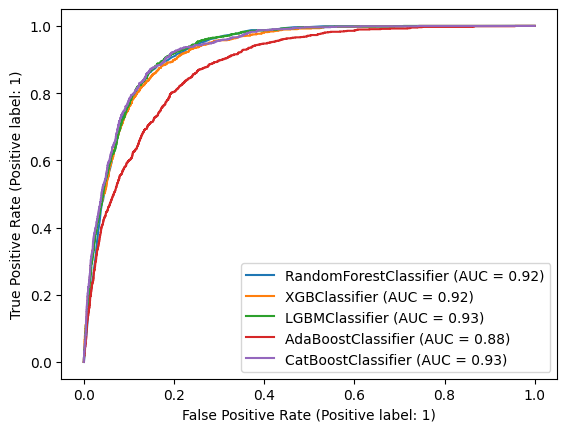

In [201]:

rfa_disp = RocCurveDisplay.from_estimator(RFA_model_tuned, X_test, Y_test)
xgboost_disp = RocCurveDisplay.from_estimator(XGB_Model_final , X_test, Y_test,ax=rfa_disp.ax_)
lgbm_disp = RocCurveDisplay.from_estimator(LGBM_model_validated, X_test, Y_test, ax=rfa_disp.ax_)
ada_disp = RocCurveDisplay.from_estimator(adaboost_model, X_test, Y_test, ax = rfa_disp.ax_)
cat_disp = RocCurveDisplay.from_estimator(cat_model,X_test,Y_test,ax = rfa_disp.ax_)

Navie Bayes Algorithm

In [202]:

from sklearn.metrics import roc_auc_score
from sklearn.naive_bayes import GaussianNB
gnb =  GaussianNB()
gnb.fit(X_smote,Y_smote)
Y_predict_gnb = gnb.predict_proba(X_test)
roc_auc_score(Y_test,Y_predict_gnb[:,1])

0.8121136164663231

In [203]:

Y_predict_gnb = gnb.predict(X_test)
accuracy_score(Y_test,Y_predict_gnb)

0.6999225749364009

F1 score for navie bayes algorithm

In [223]:
from sklearn.metrics import f1_score
f1_score(Y_test,Y_predict_gnb)

0.37126303592120513

Trying to predict the best threshold to improve accuracy

In [204]:

pred=[]
for model in [XGB_Model_final,cat_model,LGBM_model_validated,adaboost_model]:
    pred.append(pd.Series(model.predict_proba(X_test)[:,1]))
final_prediction=pd.concat(pred,axis=1).mean(axis=1)
print('Ensemble test roc-auc: {}'.format(roc_auc_score(Y_test,final_prediction)))

Ensemble test roc-auc: 0.9289914038102227


In [205]:

from sklearn.metrics import roc_curve
fpr, tpr, thresholds = roc_curve(Y_test, final_prediction)
thresholds

array([1.86864311, 0.86864311, 0.85894197, ..., 0.11986966, 0.1198675 ,
       0.11397261])

In [206]:

accuracy_ls = []
for thres in thresholds:
    y_pred = np.where(final_prediction>thres,1,0)
    accuracy_ls.append(accuracy_score(Y_test, y_pred, normalize=True))
    
accuracy_ls = pd.concat([pd.Series(thresholds), pd.Series(accuracy_ls)],
                        axis=1)
accuracy_ls.columns = ['thresholds', 'accuracy']
accuracy_ls.sort_values(by='accuracy', ascending=False, inplace=True)
accuracy_ls.head()

,thresholds,accuracy
297,0.686586,0.909081
312,0.677843,0.909081
309,0.679973,0.908970
298,0.686223,0.908970
296,0.686992,0.908970


In [207]:

y_pred_threshold = (cat_model.predict_proba(X_test)[:,1] >= 0.658964).astype(bool) 

In [208]:

accuracy_score(Y_test,y_pred_threshold )

0.9076429598495742

In [209]:

confusion_mat_threshold = confusion_matrix(Y_test,y_pred_threshold )
confusion_mat_threshold
     

array([[7666,  344],
       [ 491,  540]], dtype=int64)

In [210]:
import matplotlib.pyplot as plt
import seaborn as sns
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([0, 1], [0, 1], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

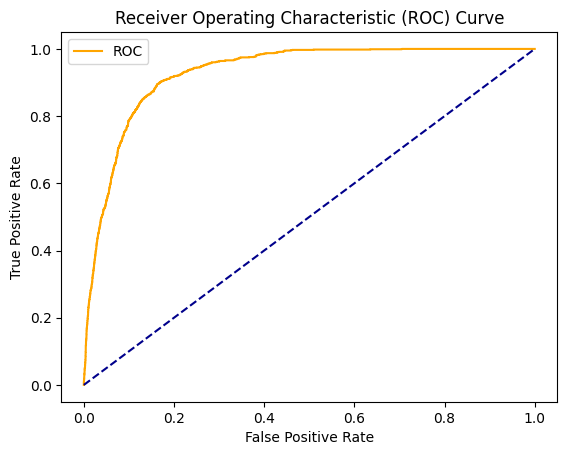

In [211]:
plot_roc_curve(fpr,tpr)

Feature Selection ( features that doesnt show big variance)

In [212]:

from sklearn.feature_selection import VarianceThreshold
var_thres=VarianceThreshold(threshold=0)
var_thres.fit(data)

VarianceThreshold(threshold=0)

In [213]:
var_thres.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True])

In [214]:

var_thres=VarianceThreshold(threshold=0.4)
var_thres.fit(data)

VarianceThreshold(threshold=0.4)

In [215]:
var_thres.get_support()
     

array([ True,  True, False,  True,  True,  True,  True,  True,  True,
       False, False,  True,  True])

In [216]:
constant_columns = [column for column in data.columns
                    if column not in data.columns[var_thres.get_support()]]

print(len(constant_columns))

3


In [217]:

for feature in constant_columns:
     print(feature)

marital
prev_outcome
y_new


In [218]:

from sklearn.ensemble import VotingClassifier
model1 = xgb.XGBClassifier(random_state=7,learning = 0.1)
model2 = CatBoostClassifier(random_state=7)
model3 =  LGBMClassifier(random_state = 7)

model = VotingClassifier(estimators=[('xgb', model1), ('cat', model2),('LGBM',model3)], voting='soft') 

model.fit(X_smote,Y_smote) 

Y_predict_voting = model.predict(X_test)

[09:07:06] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0fdc6d574b9c0d168-1\xgboost\xgboost-ci-windows\src\learner.cc:767: 
Parameters: { "learning" } are not used.



Learning rate set to 0.060761
0:	learn: 0.6513723	total: 38.2ms	remaining: 38.1s
1:	learn: 0.6164905	total: 65.5ms	remaining: 32.7s
2:	learn: 0.5881921	total: 88.9ms	remaining: 29.6s
3:	learn: 0.5637526	total: 113ms	remaining: 28.2s
4:	learn: 0.5423712	total: 143ms	remaining: 28.4s
5:	learn: 0.5266146	total: 174ms	remaining: 28.8s
6:	learn: 0.5118573	total: 207ms	remaining: 29.3s
7:	learn: 0.4980850	total: 237ms	remaining: 29.4s
8:	learn: 0.4860477	total: 260ms	remaining: 28.6s
9:	learn: 0.4789985	total: 285ms	remaining: 28.2s
10:	learn: 0.4697202	total: 307ms	remaining: 27.6s
11:	learn: 0.4534964	total: 334ms	remaining: 27.5s
12:	learn: 0.4466167	total: 356ms	remaining: 27s
13:	learn: 0.4375580	total: 379ms	remaining: 26.7s
14:	learn: 0.4251536	total: 405ms	remaining: 26.6s
15:	learn: 0.4213776	total: 434ms	remaining: 26.7s
16:	learn: 0.4162489	total: 460ms	remaining: 26.6s
17:	learn: 0.4113641	total: 485ms	remaining: 26.5s
18:	learn: 0.4036740	total: 507ms	remaining: 26.2s
19:	learn:

In [219]:
roc_auc_score(Y_test,model.predict_proba(X_test)[:,1])

0.9298735455559309

In [220]:

accuracy_score(Y_test,Y_predict_voting)

0.8987943811525274

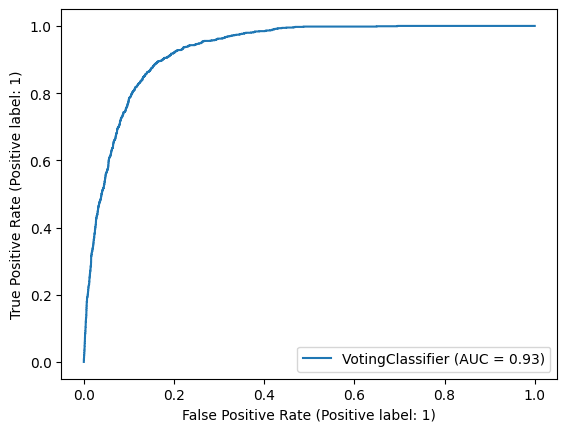

In [221]:
vote_disp = RocCurveDisplay.from_estimator(model, X_test, Y_test)

F1 Score voting classifier

In [222]:
from sklearn.metrics import f1_score
f1_score(Y_test,Y_predict_voting)

0.6064516129032258